# Data Preprocessing and EDA

### Libraries

In [1]:
# Basic data manipulation and computation libraries
import numpy as np
import pandas as pd

# Data visualization libraries
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
sns.set(style="whitegrid")  # Set plot style for seaborn

# Machine learning utilities
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, precision_score, recall_score, f1_score, roc_curve, roc_auc_score

# Sklearn classifiers
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier, ExtraTreesClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB, MultinomialNB, BernoulliNB
from sklearn.linear_model import LogisticRegression, RidgeClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis, QuadraticDiscriminantAnalysis
from sklearn.neural_network import MLPClassifier

# Additional ensemble and boosting classifiers
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from catboost import CatBoostClassifier

# Deep learning libraries
import tensorflow as tf
from tensorflow.keras import layers
import keras

from plotly.graph_objs import go
from imblearn.over_sampling import SMOTE

from datetime import datetime
start_time = datetime.now()

# The rest of the script remains unchanged


### Data Inspection

In [2]:
df = pd.read_csv('online_shoppers_intention.csv')

In [3]:
df

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue
0,0,0.0,0,0.0,1,0.000000,0.200000,0.200000,0.000000,0.0,Feb,1,1,1,1,Returning_Visitor,False,False
1,0,0.0,0,0.0,2,64.000000,0.000000,0.100000,0.000000,0.0,Feb,2,2,1,2,Returning_Visitor,False,False
2,0,0.0,0,0.0,1,0.000000,0.200000,0.200000,0.000000,0.0,Feb,4,1,9,3,Returning_Visitor,False,False
3,0,0.0,0,0.0,2,2.666667,0.050000,0.140000,0.000000,0.0,Feb,3,2,2,4,Returning_Visitor,False,False
4,0,0.0,0,0.0,10,627.500000,0.020000,0.050000,0.000000,0.0,Feb,3,3,1,4,Returning_Visitor,True,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12325,3,145.0,0,0.0,53,1783.791667,0.007143,0.029031,12.241717,0.0,Dec,4,6,1,1,Returning_Visitor,True,False
12326,0,0.0,0,0.0,5,465.750000,0.000000,0.021333,0.000000,0.0,Nov,3,2,1,8,Returning_Visitor,True,False
12327,0,0.0,0,0.0,6,184.250000,0.083333,0.086667,0.000000,0.0,Nov,3,2,1,13,Returning_Visitor,True,False
12328,4,75.0,0,0.0,15,346.000000,0.000000,0.021053,0.000000,0.0,Nov,2,2,3,11,Returning_Visitor,False,False


In [4]:
df.head()

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue
0,0,0.0,0,0.0,1,0.000000,0.20,0.20,0.0,0.0,Feb,1,1,1,1,Returning_Visitor,False,False
1,0,0.0,0,0.0,2,64.000000,0.00,0.10,0.0,0.0,Feb,2,2,1,2,Returning_Visitor,False,False
2,0,0.0,0,0.0,1,0.000000,0.20,0.20,0.0,0.0,Feb,4,1,9,3,Returning_Visitor,False,False
3,0,0.0,0,0.0,2,2.666667,0.05,0.14,0.0,0.0,Feb,3,2,2,4,Returning_Visitor,False,False
4,0,0.0,0,0.0,10,627.500000,0.02,0.05,0.0,0.0,Feb,3,3,1,4,Returning_Visitor,True,False


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12330 entries, 0 to 12329
Data columns (total 18 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Administrative           12330 non-null  int64  
 1   Administrative_Duration  12330 non-null  float64
 2   Informational            12330 non-null  int64  
 3   Informational_Duration   12330 non-null  float64
 4   ProductRelated           12330 non-null  int64  
 5   ProductRelated_Duration  12330 non-null  float64
 6   BounceRates              12330 non-null  float64
 7   ExitRates                12330 non-null  float64
 8   PageValues               12330 non-null  float64
 9   SpecialDay               12330 non-null  float64
 10  Month                    12330 non-null  object 
 11  OperatingSystems         12330 non-null  int64  
 12  Browser                  12330 non-null  int64  
 13  Region                   12330 non-null  int64  
 14  TrafficType           

In [6]:
df.isnull().sum()


Administrative             0
Administrative_Duration    0
Informational              0
Informational_Duration     0
ProductRelated             0
ProductRelated_Duration    0
BounceRates                0
ExitRates                  0
PageValues                 0
SpecialDay                 0
Month                      0
OperatingSystems           0
Browser                    0
Region                     0
TrafficType                0
VisitorType                0
Weekend                    0
Revenue                    0
dtype: int64

In [7]:
print(df.columns)

Index(['Administrative', 'Administrative_Duration', 'Informational',
       'Informational_Duration', 'ProductRelated', 'ProductRelated_Duration',
       'BounceRates', 'ExitRates', 'PageValues', 'SpecialDay', 'Month',
       'OperatingSystems', 'Browser', 'Region', 'TrafficType', 'VisitorType',
       'Weekend', 'Revenue'],
      dtype='object')


In [8]:
df.describe()


,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,OperatingSystems,Browser,Region,TrafficType
count,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000
mean,2.315166,80.818611,0.503569,34.472398,31.731468,1194.746220,0.022191,0.043073,5.889258,0.061427,2.124006,2.357097,3.147364,4.069586
std,3.321784,176.779107,1.270156,140.749294,44.475503,1913.669288,0.048488,0.048597,18.568437,0.198917,0.911325,1.717277,2.401591,4.025169
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000
25%,0.000000,0.000000,0.000000,0.000000,7.000000,184.137500,0.000000,0.014286,0.000000,0.000000,2.000000,2.000000,1.000000,2.000000
50%,1.000000,7.500000,0.000000,0.000000,18.000000,598.936905,0.003112,0.025156,0.000000,0.000000,2.000000,2.000000,3.000000,2.000000
75%,4.000000,93.256250,0.000000,0.000000,38.000000,1464.157214,0.016813,0.050000,0.000000,0.000000,3.000000,2.000000,4.000000,4.000000
max,27.000000,3398.750000,24.000000,2549.375000,705.000000,63973.522230,0.200000,0.200000,361.763742,1.000000,8.000000,13.000000,9.000000,20.000000


In [9]:
# Count occurrences of each unique value in the 'Month' column
df['Month'].value_counts()

# Count occurrences of each unique value in the 'VisitorType' column
df['VisitorType'].value_counts()


VisitorType
Returning_Visitor    10551
New_Visitor           1694
Other                   85
Name: count, dtype: int64

In [10]:
# Compute summary statistics for numerical features
numerical_statistics = df.describe()

# Print the summary statistics
print("Summary Statistics for Numerical Features:")
print(numerical_statistics)


Summary Statistics for Numerical Features:
       Administrative  Administrative_Duration  Informational  \
count    12330.000000             12330.000000   12330.000000   
mean         2.315166                80.818611       0.503569   
std          3.321784               176.779107       1.270156   
min          0.000000                 0.000000       0.000000   
25%          0.000000                 0.000000       0.000000   
50%          1.000000                 7.500000       0.000000   
75%          4.000000                93.256250       0.000000   
max         27.000000              3398.750000      24.000000   

       Informational_Duration  ProductRelated  ProductRelated_Duration  \
count            12330.000000    12330.000000             12330.000000   
mean                34.472398       31.731468              1194.746220   
std                140.749294       44.475503              1913.669288   
min                  0.000000        0.000000                 0.000000   
2

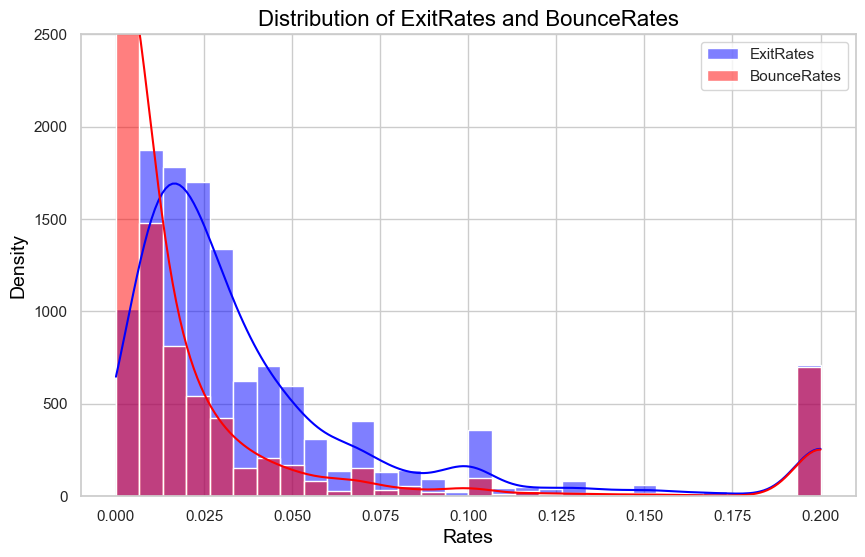

In [11]:
# Set style
sns.set_style("whitegrid")

# Create a figure
plt.figure(figsize=(10, 6))

# Plot histogram for 'ExitRates'
sns.histplot(df['ExitRates'], bins=30, kde=True, color='blue', label='ExitRates', alpha=0.5)

# Plot histogram for 'BounceRates'
sns.histplot(df['BounceRates'], bins=30, kde=True, color='red', label='BounceRates', alpha=0.5)

# Add labels and title
plt.xlabel('Rates', fontsize=14, color='black')
plt.ylabel('Density', fontsize=14, color='black')
plt.title('Distribution of ExitRates and BounceRates', fontsize=16, color='black')
plt.legend()

# Zoom in on the y-axis
plt.ylim(0, 2500)

# Show plot
plt.show()


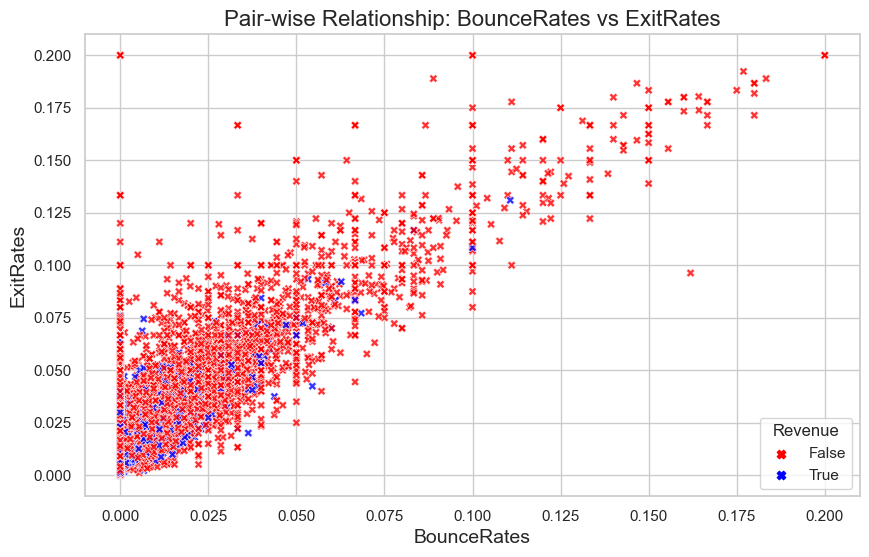

In [12]:
# Set style
sns.set_style("whitegrid")

# Create a figure
plt.figure(figsize=(10, 6))

# Define colors for Buy and Not Buy
palette_colors = {True: 'blue', False: 'red'}

# Define marker style
markers = {True: 'X', False: 'X'}

# Plot scatterplot
sns.scatterplot(data=df, x='BounceRates', y='ExitRates', hue='Revenue', palette=palette_colors, style='Revenue', markers=markers, alpha=0.8)

# Add labels and title
plt.xlabel('BounceRates', fontsize=14)
plt.ylabel('ExitRates', fontsize=14)
plt.title('Pair-wise Relationship: BounceRates vs ExitRates', fontsize=16)

# Show plot
plt.show()


### Data visualization

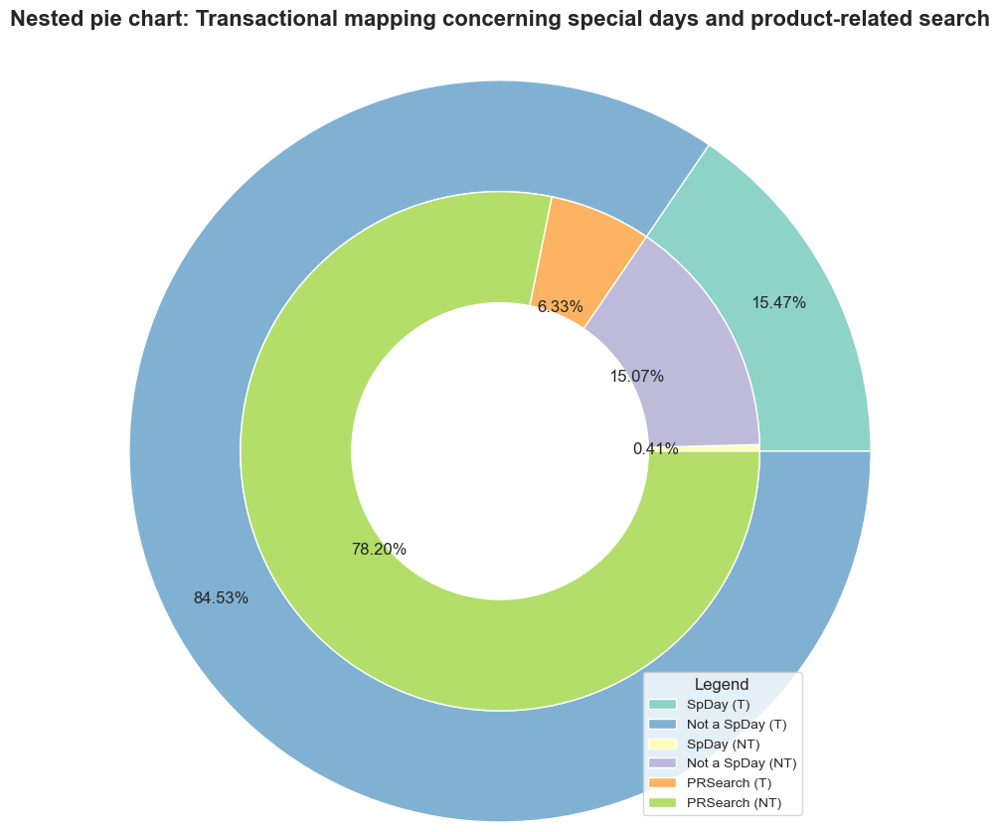

In [13]:
# Select sessions with purchases and at least one product-related page visited
PRT = df.loc[(df['Revenue'] == True) & (df['ProductRelated'] != 0)]

# Break down sessions based on proximity to a special day (purchased sessions)
PRS1T = PRT.loc[PRT['SpecialDay'] == 1.0]
PRS2T = PRT.loc[PRT['SpecialDay'] == 0.8]
PRS3T = PRT.loc[PRT['SpecialDay'] == 0.6]

# Select sessions without purchases and at least one product-related page visited
PRNT = df.loc[(df['Revenue'] == False) & (df['ProductRelated'] != 0)]

# Break down sessions based on proximity to a special day (non-purchased sessions)
PRS1NT = PRNT.loc[PRNT['SpecialDay'] == 1.0]
PRS2NT = PRNT.loc[PRNT['SpecialDay'] == 0.8]
PRS3NT = PRNT.loc[PRNT['SpecialDay'] == 0.6]

# Initialize figure with improved spacing
fig, ax = plt.subplots(figsize=(15, 10), subplot_kw=dict(aspect="equal"))

# Define title for the plot
fig.suptitle('Nested pie chart: Transactional mapping concerning special days and product-related search', fontsize=16, fontweight='bold', y=0.95)

# Define size of the inner and outer pie charts
size = 0.45

# Compute segment values for pie charts
vals = np.array([[len(PRS1T) + len(PRS2T) + len(PRS3T), len(PRT) - (len(PRS1T) + len(PRS2T) + len(PRS3T))],
                 [len(PRS1NT) + len(PRS2NT) + len(PRS3NT), len(PRNT) - (len(PRS1NT) + len(PRS2NT) + len(PRS3NT))]])

# Use the "Set3" colormap for a different color scheme
outer_colors = plt.cm.Set3(np.arange(2) * 4)  # Select specific colors for outer pie
inner_colors = plt.cm.Set3(np.arange(4) * 2 + 1)  # Select specific colors for inner pie

# Define segment labels
labels_inner = ["SpDay (T)", "Not a SpDay (T)", "SpDay (NT)", "Not a SpDay (NT)"]
labels_outer = ['PRSearch (T)', 'PRSearch (NT)']

# Construct outer pie chart (Revenue)
ax.pie(vals.sum(axis=1), radius=1.5, colors=outer_colors,
       wedgeprops=dict(width=size, edgecolor='white'), autopct='%.2f%%', pctdistance=0.85)

# Construct inner pie chart (SpecialDay)
ax.pie(vals.flatten(), radius=1.5 - size, colors=inner_colors,
       wedgeprops=dict(width=size, edgecolor='white'), autopct='%.2f%%', labeldistance=0.75)

# Add legend to the plot
plt.legend(labels=labels_inner + labels_outer, loc='lower right', bbox_to_anchor=(1, -0.1), title="Legend", fontsize='small')

# Adjust layout for better presentation
plt.tight_layout(rect=[0, 0.1, 1, 0.95])  # Fit subplots within the figure area

plt.show()


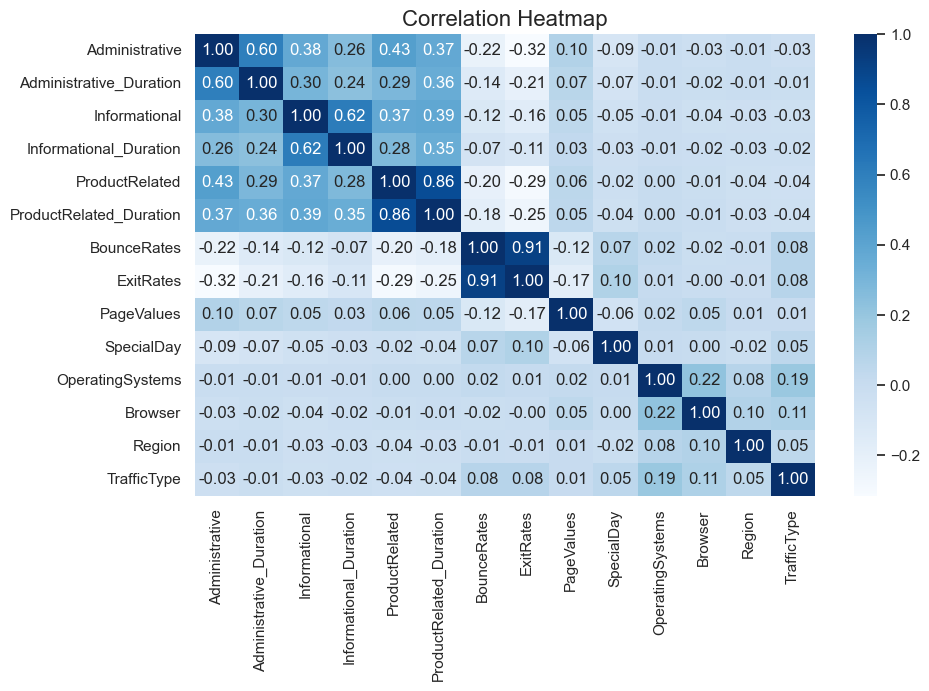

In [14]:
# Select only numeric columns from the DataFrame
numeric_columns = df.select_dtypes(include=[np.number])

# Calculate the correlation matrix for the numeric columns
correlation_matrix = numeric_columns.corr()

# Create a heatmap to visualize the correlations
plt.figure(figsize=(10, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='Blues', fmt=".2f")  # Changed cmap to 'Blues'
plt.title('Correlation Heatmap', fontsize=16)
plt.show()


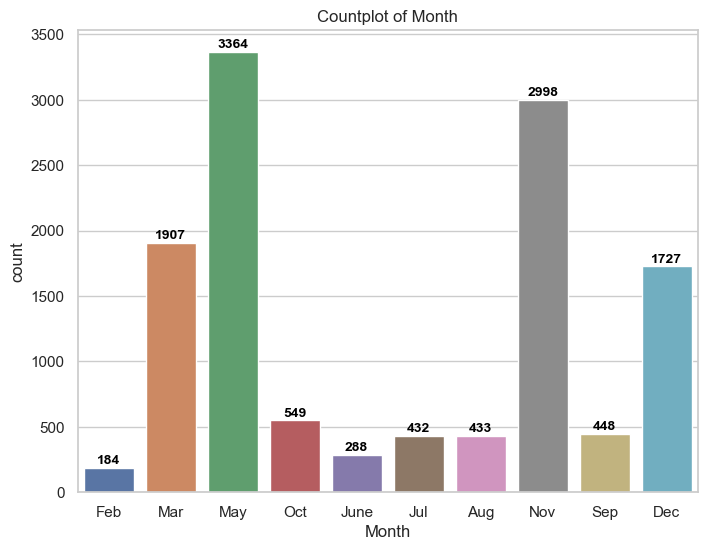

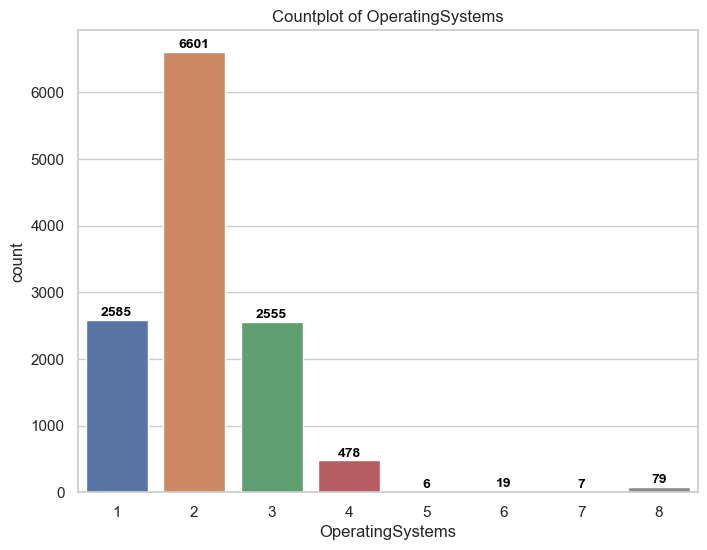

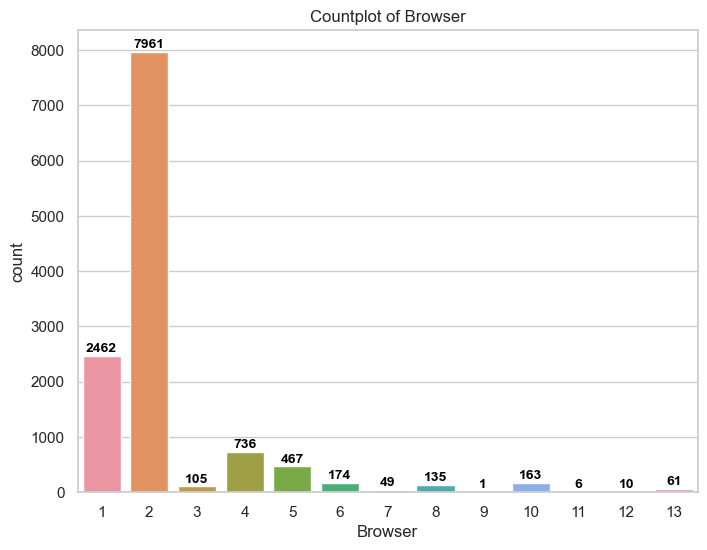

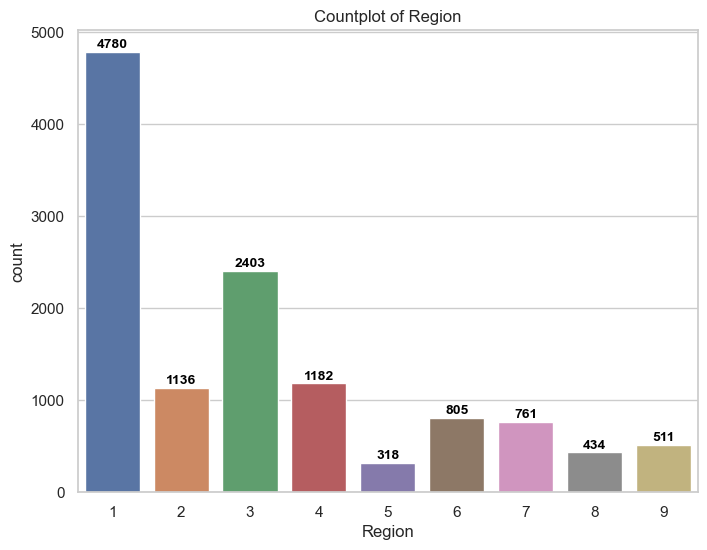

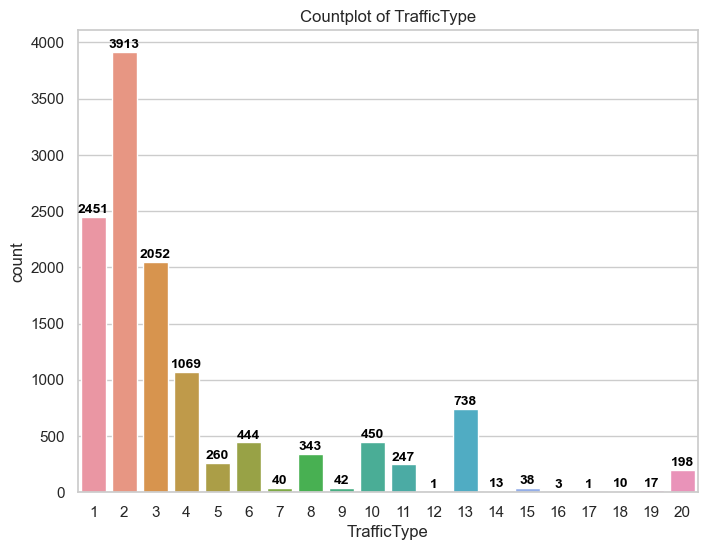

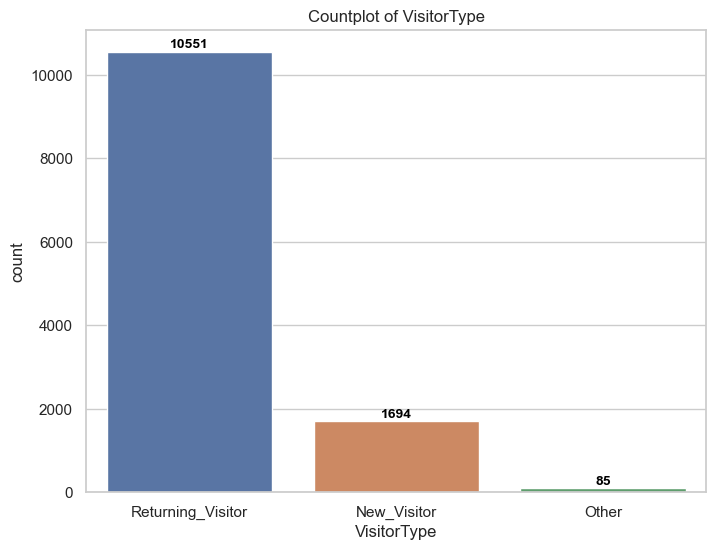

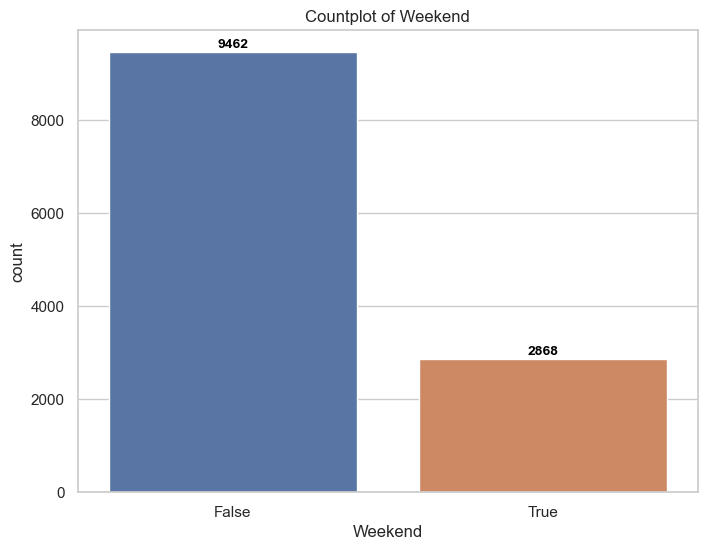

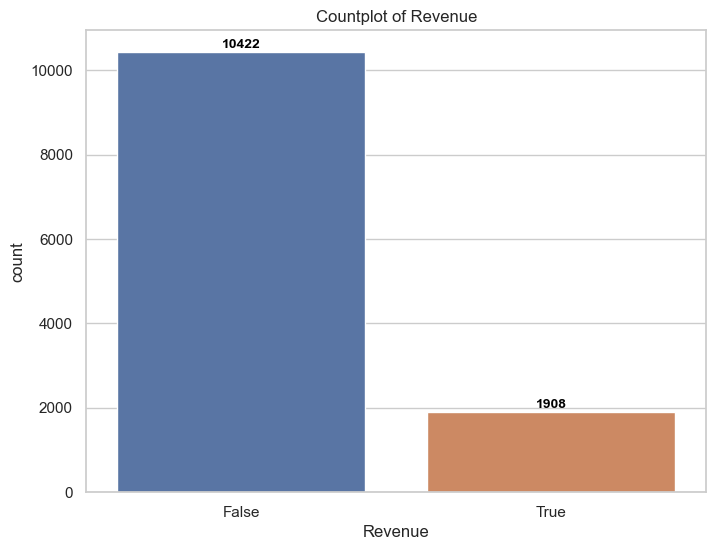

Count report for Month:
-0.4: 184.0
0.6: 1907.0
1.6: 3364.0
2.6: 549.0
3.6: 288.0
4.6: 432.0
5.6: 433.0
6.6: 2998.0
7.6: 448.0
8.6: 1727.0

Count report for OperatingSystems:
-0.4: 2585.0
0.6: 6601.0
1.6: 2555.0
2.6: 478.0
3.6: 6.0
4.6: 19.0
5.6: 7.0
6.6: 79.0

Count report for Browser:
-0.4: 2462.0
0.6: 7961.0
1.6: 105.0
2.6: 736.0
3.6: 467.0
4.6: 174.0
5.6: 49.0
6.6: 135.0
7.6: 1.0
8.6: 163.0
9.6: 6.0
10.6: 10.0
11.6: 61.0

Count report for Region:
-0.4: 4780.0
0.6: 1136.0
1.6: 2403.0
2.6: 1182.0
3.6: 318.0
4.6: 805.0
5.6: 761.0
6.6: 434.0
7.6: 511.0

Count report for TrafficType:
-0.4: 2451.0
0.6: 3913.0
1.6: 2052.0
2.6: 1069.0
3.6: 260.0
4.6: 444.0
5.6: 40.0
6.6: 343.0
7.6: 42.0
8.6: 450.0
9.6: 247.0
10.6: 1.0
11.6: 738.0
12.6: 13.0
13.6: 38.0
14.6: 3.0
15.6: 1.0
16.6: 10.0
17.6: 17.0
18.6: 198.0

Count report for VisitorType:
-0.4: 10551.0
0.6: 1694.0
1.6: 85.0

Count report for Weekend:
-0.4: 9462.0
0.6: 2868.0

Count report for Revenue:
-0.4: 10422.0
0.6: 1908.0



In [15]:
# List of categorical and boolean variables
categorical_variables = ['Month', 'OperatingSystems', 'Browser', 'Region', 'TrafficType', 'VisitorType', 'Weekend', 'Revenue']

# Create an empty dictionary to store count values
count_values = {}

# Plot count plots for each categorical and boolean variable and store count values
for var in categorical_variables:
    plt.figure(figsize=(8, 6))
    ax = sns.countplot(x=var, data=df)
    plt.title(f"Countplot of {var}")
    
    # Add text annotations on the bars and store count values
    count_values[var] = {}
    for p in ax.patches:
        count_values[var][p.get_x()] = p.get_height()
        ax.annotate(f'{p.get_height():.0f}', (p.get_x() + p.get_width() / 2., p.get_height()),
                    ha='center', va='center', fontsize=10, color='black', fontweight='bold', xytext=(0, 5),
                    textcoords='offset points')
    
    plt.show()

# Print text representation of count values
for var, values in count_values.items():
    print(f"Count report for {var}:")
    for value, count in values.items():
        print(f"{value}: {count}")
    print()


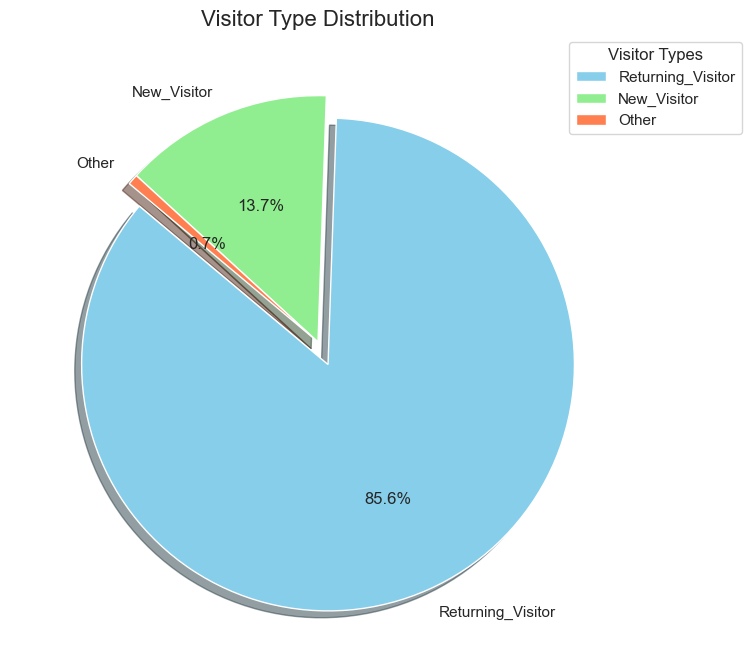

In [16]:
# Create a pie chart to visualize Visitor Type distribution
plt.figure(figsize=(8, 8))
colors = ['skyblue', 'lightgreen', 'coral']  # Custom colors for the pie chart
explode = (0.1, 0, 0)  # Slightly explode the first slice for emphasis

df['VisitorType'].value_counts().plot.pie(autopct='%1.1f%%', colors=colors, explode=explode, startangle=140, shadow=True)

plt.title('Visitor Type Distribution', fontsize=16)
plt.ylabel('')  # Hide the y-label as it's unnecessary for pie charts
plt.legend(title='Visitor Types', loc='upper right', bbox_to_anchor=(1.2, 1.0))  # Add a legend outside the plot
plt.show()


### Bar Plot for 'Special Day' vs. 'Revenue'

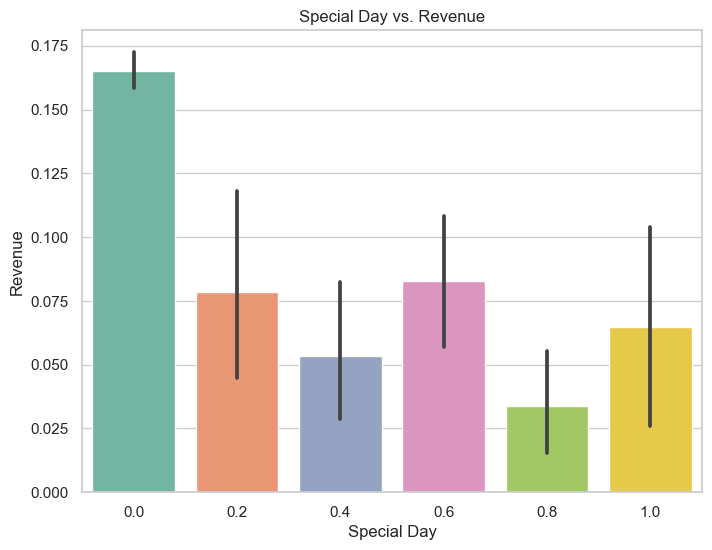

In [17]:
# Create a bar plot to compare Special Day with Revenue
plt.figure(figsize=(8, 6))
sns.barplot(data=df, x='SpecialDay', y='Revenue', palette='Set2')
plt.xlabel("Special Day")
plt.ylabel("Revenue")
plt.title("Special Day vs. Revenue")
plt.show()


In [18]:
# Define trace for scatter plot
trace = go.Scatter3d(
    x=df['BounceRates'],
    y=df['ExitRates'],
    z=df['PageValues'],
    mode='markers',
    marker=dict(
        size=8,
        color=df['Revenue'].replace({'Yes': 0, 'No': 1}),
        colorscale='Viridis',
        opacity=0.8
    )
)

# Define layout
layout = go.Layout(
    title='3D view of Bounce Rates, Exit Rates and Page Value',
    scene=dict(
        xaxis=dict(title='Bounce Rate'),
        yaxis=dict(title='Exit Rate'),
        zaxis=dict(title='Page Value')
    )
)

# Create figure
fig = go.Figure(data=[trace], layout=layout)

# Show plot
fig.show()


### Correlation Matrix with Plotly

In [19]:
# Create the correlation matrix and select numeric columns
numeric_columns = df.select_dtypes(include=['int64', 'float64'])
correlation_matrix = numeric_columns.corr()

# Create the heatmap
fig = px.imshow(correlation_matrix, 
                labels=dict(x="Features", y="Features"),
                x=correlation_matrix.columns,
                y=correlation_matrix.columns)

# Update x-axis position to be at the top
fig.update_xaxes(side="top")

# Display the plot within the Jupyter Notebook cell
fig.show(renderer="notebook")


### Scatter Plot for 'BounceRates' vs. 'ExitRates':

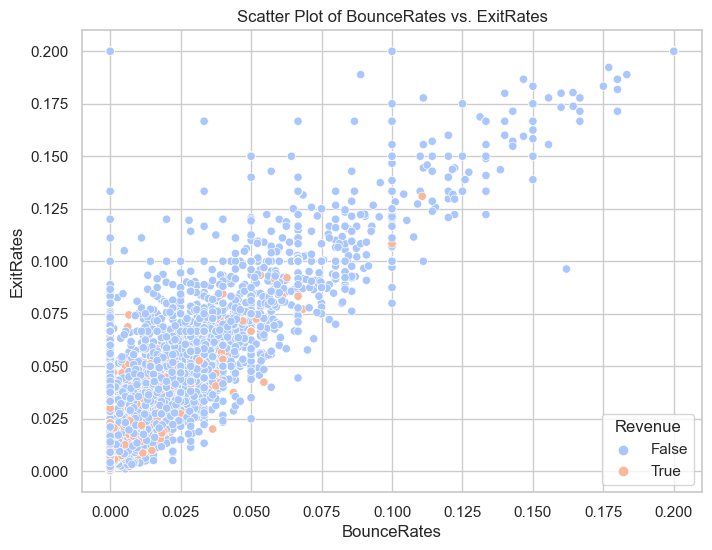

In [20]:
# Create a scatter plot of BounceRates vs. ExitRates
plt.figure(figsize=(8, 6))
sns.scatterplot(data=df, x='BounceRates', y='ExitRates', hue='Revenue', palette='coolwarm')
plt.xlabel("BounceRates")
plt.ylabel("ExitRates")
plt.title("Scatter Plot of BounceRates vs. ExitRates")
plt.show()


### Pairwise Relationships with Revenue

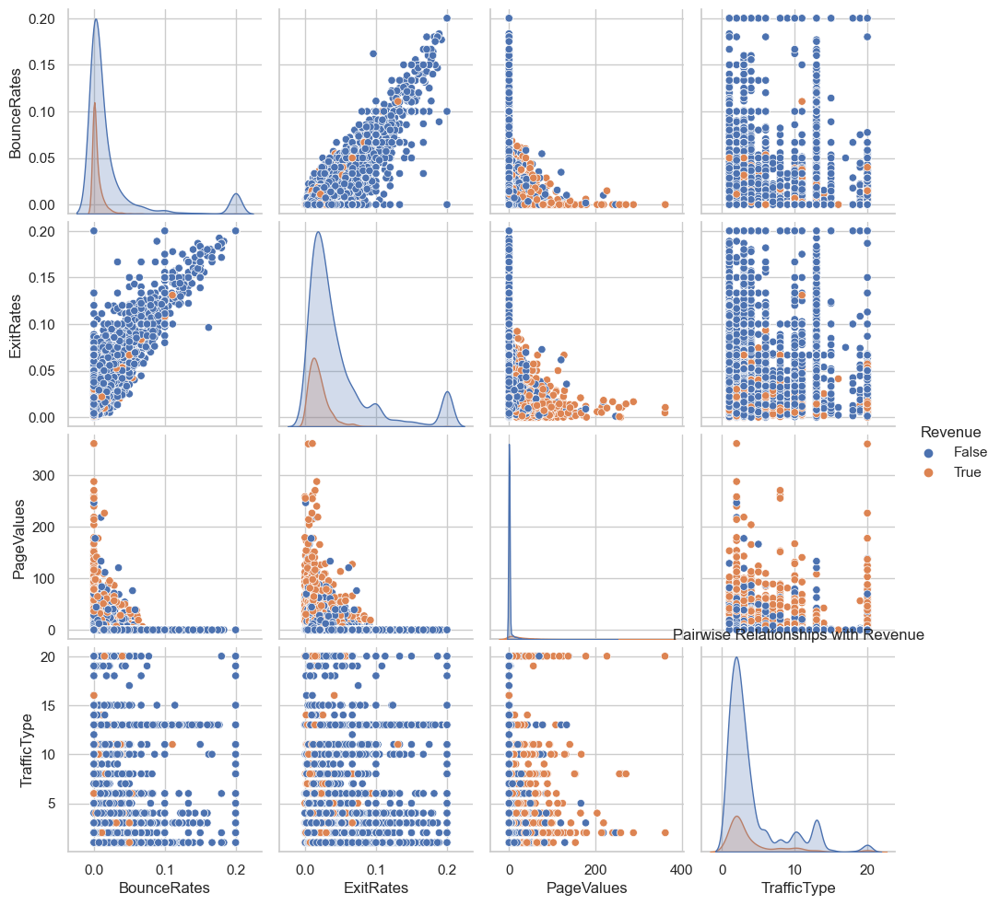

In [21]:
# Create a new DataFrame for the subset of columns
df_subset = df[['BounceRates', 'ExitRates', 'PageValues', 'TrafficType', 'Revenue']]

# Generate a pairplot using the df_subset
sns.pairplot(df_subset, hue='Revenue')
plt.title('Pairwise Relationships with Revenue')
plt.show()


# Data Preprocessing

### Feature Engineering

In [22]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12330 entries, 0 to 12329
Data columns (total 18 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Administrative           12330 non-null  int64  
 1   Administrative_Duration  12330 non-null  float64
 2   Informational            12330 non-null  int64  
 3   Informational_Duration   12330 non-null  float64
 4   ProductRelated           12330 non-null  int64  
 5   ProductRelated_Duration  12330 non-null  float64
 6   BounceRates              12330 non-null  float64
 7   ExitRates                12330 non-null  float64
 8   PageValues               12330 non-null  float64
 9   SpecialDay               12330 non-null  float64
 10  Month                    12330 non-null  object 
 11  OperatingSystems         12330 non-null  int64  
 12  Browser                  12330 non-null  int64  
 13  Region                   12330 non-null  int64  
 14  TrafficType           

In [23]:
# Perform one-hot encoding for categorical columns 'Month' and 'VisitorType'
df_encoded = pd.get_dummies(df, columns=['Month', 'VisitorType'], drop_first=True)

In [24]:
print(df.columns)

Index(['Administrative', 'Administrative_Duration', 'Informational',
       'Informational_Duration', 'ProductRelated', 'ProductRelated_Duration',
       'BounceRates', 'ExitRates', 'PageValues', 'SpecialDay', 'Month',
       'OperatingSystems', 'Browser', 'Region', 'TrafficType', 'VisitorType',
       'Weekend', 'Revenue'],
      dtype='object')


In [25]:
df_encoded

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,...,Month_Feb,Month_Jul,Month_June,Month_Mar,Month_May,Month_Nov,Month_Oct,Month_Sep,VisitorType_Other,VisitorType_Returning_Visitor
0,0,0.0,0,0.0,1,0.000000,0.200000,0.200000,0.000000,0.0,...,True,False,False,False,False,False,False,False,False,True
1,0,0.0,0,0.0,2,64.000000,0.000000,0.100000,0.000000,0.0,...,True,False,False,False,False,False,False,False,False,True
2,0,0.0,0,0.0,1,0.000000,0.200000,0.200000,0.000000,0.0,...,True,False,False,False,False,False,False,False,False,True
3,0,0.0,0,0.0,2,2.666667,0.050000,0.140000,0.000000,0.0,...,True,False,False,False,False,False,False,False,False,True
4,0,0.0,0,0.0,10,627.500000,0.020000,0.050000,0.000000,0.0,...,True,False,False,False,False,False,False,False,False,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12325,3,145.0,0,0.0,53,1783.791667,0.007143,0.029031,12.241717,0.0,...,False,False,False,False,False,False,False,False,False,True
12326,0,0.0,0,0.0,5,465.750000,0.000000,0.021333,0.000000,0.0,...,False,False,False,False,False,True,False,False,False,True
12327,0,0.0,0,0.0,6,184.250000,0.083333,0.086667,0.000000,0.0,...,False,False,False,False,False,True,False,False,False,True
12328,4,75.0,0,0.0,15,346.000000,0.000000,0.021053,0.000000,0.0,...,False,False,False,False,False,True,False,False,False,True


In [26]:
print(df_encoded.columns)

Index(['Administrative', 'Administrative_Duration', 'Informational',
       'Informational_Duration', 'ProductRelated', 'ProductRelated_Duration',
       'BounceRates', 'ExitRates', 'PageValues', 'SpecialDay',
       'OperatingSystems', 'Browser', 'Region', 'TrafficType', 'Weekend',
       'Revenue', 'Month_Dec', 'Month_Feb', 'Month_Jul', 'Month_June',
       'Month_Mar', 'Month_May', 'Month_Nov', 'Month_Oct', 'Month_Sep',
       'VisitorType_Other', 'VisitorType_Returning_Visitor'],
      dtype='object')


In [27]:
# Print the new column names after encoding
print(df_encoded.columns)


Index(['Administrative', 'Administrative_Duration', 'Informational',
       'Informational_Duration', 'ProductRelated', 'ProductRelated_Duration',
       'BounceRates', 'ExitRates', 'PageValues', 'SpecialDay',
       'OperatingSystems', 'Browser', 'Region', 'TrafficType', 'Weekend',
       'Revenue', 'Month_Dec', 'Month_Feb', 'Month_Jul', 'Month_June',
       'Month_Mar', 'Month_May', 'Month_Nov', 'Month_Oct', 'Month_Sep',
       'VisitorType_Other', 'VisitorType_Returning_Visitor'],
      dtype='object')


### Split the Dataset

In [28]:
# Data Preprocessing
# Convert boolean columns to integer type
for column in df.columns.to_list():
    if df[column].dtype == bool:
        df[column] = df[column].astype(int)
    elif df[column].dtype == object:
        # Convert object columns to numeric representations
        unique_elements = list(df[column].unique())
        df[column] = df[column].replace(unique_elements, [x + 2 for x in range(len(unique_elements))])

# Splitting the dataset into training and testing sets based on the 'Month' column
df_train = df.loc[~df['Month'].isin([2, 11, 5])]
df_test = df.loc[df['Month'].isin([2, 11, 5])]

# Separating features and labels
x_train = df_train.iloc[:, 0:17].astype('float32')
y_train = df_train.iloc[:, 17].astype('int')
x_test = df_test.iloc[:, 0:17].astype('float32')
y_test = df_test.iloc[:, 17].astype('int')

# Handling Imbalance
# Applying SMOTE to address class imbalance
smote = SMOTE(random_state=42)
X_train_balanced, y_train_balanced = smote.fit_resample(x_train, y_train)

# Feature Scaling
# Standardizing features using StandardScaler
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train_balanced)
X_test_scaled = scaler.transform(x_test)


### Preprocess the data (scaling)

### Result function 

In [29]:
# Initialize an empty dictionary to store the results
results = {}

In [30]:
def evaluate_classifier(classifier, X_test, y_test, classifier_name, threshold=None):
    """
    Parameters:
    - classifier: The trained classifier to evaluate.
    - X_test: Test features.
    - y_test: True labels for the test data.
    - classifier_name: Name of the classifier (for display purposes).
    - threshold: Threshold for converting predicted probabilities to binary labels. Default is None.
    """
    # Predict labels using the classifier
    y_pred = classifier.predict(X_test)

    # Apply threshold if provided
    if threshold is not None:
        y_pred = (y_pred > threshold).astype("int32")

    # Convert continuous predictions to binary predictions
    y_pred_binary = (y_pred > 0.5).astype(int)

    # Convert continuous targets to binary labels if necessary
    if len(np.unique(y_test)) > 2:
        y_test = (y_test > 0.5).astype(int)

    # Calculate classification metrics
    accuracy = accuracy_score(y_test, y_pred_binary)
    precision = precision_score(y_test, y_pred_binary)
    recall = recall_score(y_test, y_pred_binary)
    f1 = f1_score(y_test, y_pred_binary)

    # Confusion Matrix
    cm = confusion_matrix(y_test, y_pred_binary)

    # ROC Curve
    fpr, tpr, _ = roc_curve(y_test, y_pred_binary)
    roc_auc = roc_auc_score(y_test, y_pred_binary)

    # Classification Report
    report = classification_report(y_test, y_pred_binary)

    # Print the metrics
    print(f"Accuracy ({classifier_name}): {accuracy:.2f}")
    print(f"Precision ({classifier_name}): {precision:.2f}")
    print(f"Recall ({classifier_name}): {recall:.2f}")
    print(f"F1 Score ({classifier_name}): {f1:.2f}")

    # Plot Confusion Matrix with counts
    plt.figure(figsize=(10, 4))
    plt.subplot(1, 2, 1)
    plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
    plt.title(f'Confusion Matrix for {classifier_name}')
    plt.colorbar()
    plt.xticks([0, 1], ['Predicted 0', 'Predicted 1'])
    plt.yticks([0, 1], ['Actual 0', 'Actual 1'])
    plt.xlabel('True Label')
    plt.ylabel('Predicted Label')

    # Display the counts on top of the matrix
    tn, fp, fn, tp = cm.ravel()

    # Define text color based on background color
    text_color = 'black' if cm[0, 0] < 0.5 * cm.max() else 'white'

    # Plot text with the defined color
    plt.text(0, 0, f'TN: {tn}', ha='center', va='center', fontsize=12, color=text_color)
    plt.text(1, 0, f'FP: {fp}', ha='center', va='center', fontsize=12, color='black')
    plt.text(0, 1, f'FN: {fn}', ha='center', va='center', fontsize=12, color='black')
    plt.text(1, 1, f'TP: {tp}', ha='center', va='center', fontsize=12, color='black')

    # Plot ROC Curve
    plt.subplot(1, 2, 2)
    plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate (FPR)')
    plt.ylabel('True Positive Rate (TPR)')
    plt.title(f'ROC Curve for {classifier_name}')
    plt.legend(loc='lower right')

    # Print Classification Report
    print(f'Classification Report for {classifier_name}:\n{report}\n')

    plt.tight_layout()
    plt.show()

    # Store the results in the dictionary
    results[classifier_name] = {
        'Accuracy': accuracy,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1
    }

    # Duplicate the same results in the 'ROC-AUC' key
    results[classifier_name]['ROC-AUC'] = roc_auc


# Implement Logistic Regression Classifier

Accuracy (Logistic Regression): 0.64
Precision (Logistic Regression): 0.26
Recall (Logistic Regression): 0.86
F1 Score (Logistic Regression): 0.39
Classification Report for Logistic Regression:
              precision    recall  f1-score   support

           0       0.96      0.61      0.75      2126
           1       0.26      0.86      0.39       334

    accuracy                           0.64      2460
   macro avg       0.61      0.73      0.57      2460
weighted avg       0.87      0.64      0.70      2460




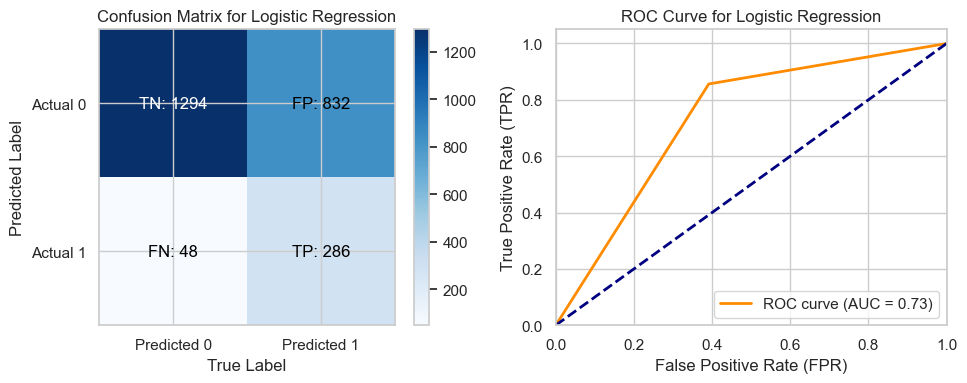

In [31]:
# Initialize the Logistic Regression classifier with a random state for reproducibility
logistic_classifier = LogisticRegression(random_state=42)

# Fit the classifier to the training data
logistic_classifier.fit(X_train_scaled, y_train_balanced)

# Predict on the test set
y_pred_logistic = logistic_classifier.predict(X_test_scaled)

# Define the name for the Logistic Regression classifier
classifier_name_logistic = "Logistic Regression"

# Evaluate the performance of the Logistic Regression classifier
evaluate_classifier(logistic_classifier, X_test_scaled, y_test, classifier_name_logistic)


# Implement K-Nearest Neighbors (KNN) Classifier

Accuracy (KNN Classifier): 0.76
Precision (KNN Classifier): 0.31
Recall (KNN Classifier): 0.67
F1 Score (KNN Classifier): 0.43
Classification Report for KNN Classifier:
              precision    recall  f1-score   support

           0       0.94      0.77      0.84      2126
           1       0.31      0.67      0.43       334

    accuracy                           0.76      2460
   macro avg       0.62      0.72      0.64      2460
weighted avg       0.85      0.76      0.79      2460




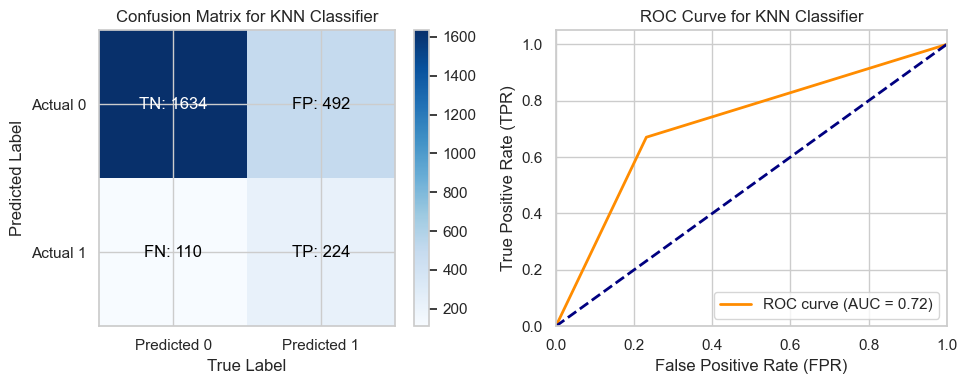

In [32]:
# Initialize the KNN classifier with a chosen number of neighbors (e.g., n_neighbors=5)
knn_classifier = KNeighborsClassifier(n_neighbors=5)

# Fit the classifier to the training data
knn_classifier.fit(X_train_scaled, y_train_balanced)

# Predict on the test set
y_pred_knn = knn_classifier.predict(X_test_scaled)

# Define the name for the KNN classifier
classifier_name_knn = "KNN Classifier"

# Evaluate the performance of the KNN classifier
evaluate_classifier(knn_classifier, X_test_scaled, y_test, classifier_name_knn)


# Implement Decision Tree Classifier

Accuracy (Decision Tree Classifier): 0.85
Precision (Decision Tree Classifier): 0.45
Recall (Decision Tree Classifier): 0.62
F1 Score (Decision Tree Classifier): 0.52
Classification Report for Decision Tree Classifier:
              precision    recall  f1-score   support

           0       0.94      0.88      0.91      2126
           1       0.45      0.62      0.52       334

    accuracy                           0.85      2460
   macro avg       0.69      0.75      0.71      2460
weighted avg       0.87      0.85      0.85      2460




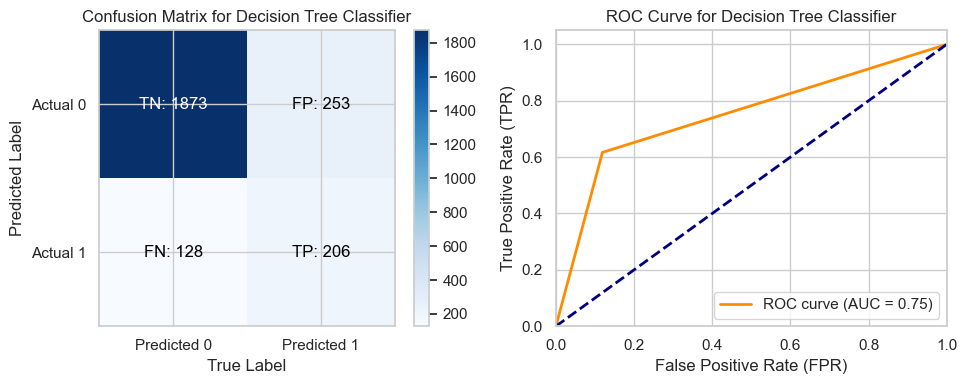

In [33]:
# Initialize the Decision Tree classifier with a random state for reproducibility
decision_tree_classifier = DecisionTreeClassifier(random_state=42)

# Fit the classifier to the training data
decision_tree_classifier.fit(X_train_scaled, y_train_balanced)

# Predict on the test set
y_pred_decision_tree = decision_tree_classifier.predict(X_test_scaled)

# Define the name for the Decision Tree classifier
classifier_name_decision_tree = "Decision Tree Classifier"

# Evaluate the performance of the Decision Tree classifier
evaluate_classifier(decision_tree_classifier, X_test_scaled, y_test, classifier_name_decision_tree)


# Implement Random Forest Classifier

Accuracy (Random Forest Classifier): 0.91
Precision (Random Forest Classifier): 0.64
Recall (Random Forest Classifier): 0.72
F1 Score (Random Forest Classifier): 0.67
Classification Report for Random Forest Classifier:
              precision    recall  f1-score   support

           0       0.95      0.94      0.94      2126
           1       0.64      0.72      0.67       334

    accuracy                           0.91      2460
   macro avg       0.80      0.83      0.81      2460
weighted avg       0.91      0.91      0.91      2460




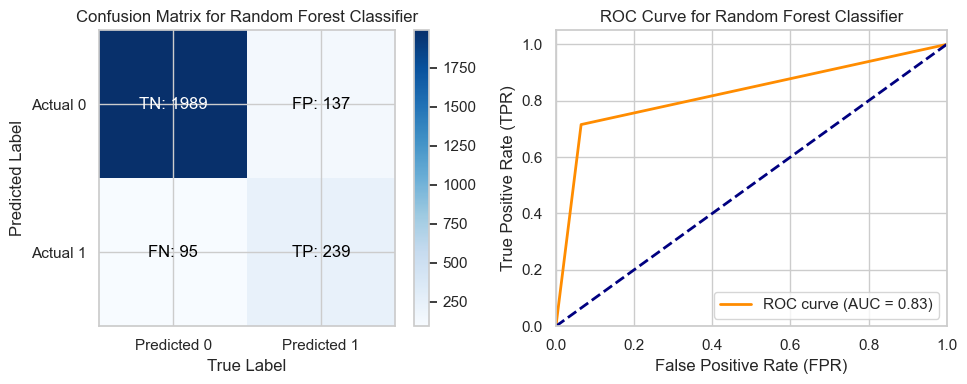

In [34]:
# Initialize the Random Forest classifier with a random state for reproducibility
random_forest_classifier = RandomForestClassifier(random_state=42)

# Fit the classifier to the training data
random_forest_classifier.fit(X_train_scaled, y_train_balanced)

# Predict on the test set
y_pred_random_forest = random_forest_classifier.predict(X_test_scaled)

# Define the name for the Random Forest classifier
classifier_name_random_forest = "Random Forest Classifier"

# Evaluate the performance of the Random Forest classifier
evaluate_classifier(random_forest_classifier, X_test_scaled, y_test, classifier_name_random_forest)


# Implement Gradient Boosting Classifier

Accuracy (Gradient Boosting Classifier): 0.90
Precision (Gradient Boosting Classifier): 0.62
Recall (Gradient Boosting Classifier): 0.70
F1 Score (Gradient Boosting Classifier): 0.65
Classification Report for Gradient Boosting Classifier:
              precision    recall  f1-score   support

           0       0.95      0.93      0.94      2126
           1       0.62      0.70      0.65       334

    accuracy                           0.90      2460
   macro avg       0.78      0.81      0.80      2460
weighted avg       0.91      0.90      0.90      2460




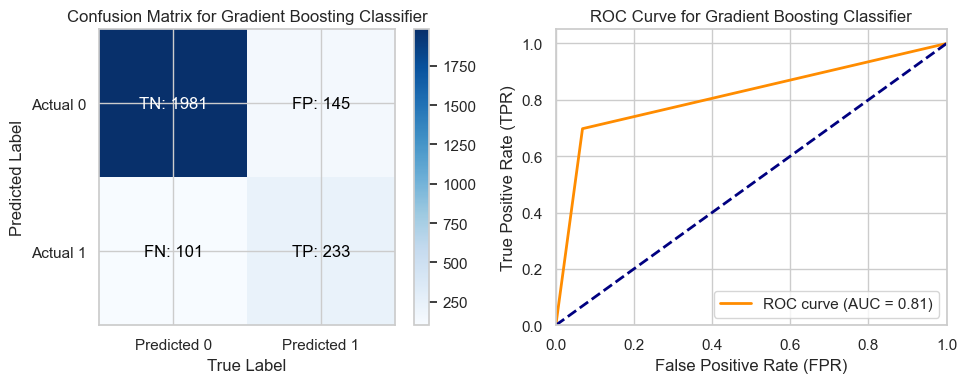

In [35]:
# Initialize the Gradient Boosting classifier with a random state for reproducibility
gradient_boosting_classifier = GradientBoostingClassifier(random_state=42)

# Fit the classifier to the training data
gradient_boosting_classifier.fit(X_train_scaled, y_train_balanced)

# Predict on the test set
y_pred_gradient_boosting = gradient_boosting_classifier.predict(X_test_scaled)

# Define the name for the Gradient Boosting classifier
classifier_name_gradient_boosting = "Gradient Boosting Classifier"

# Evaluate the performance of the Gradient Boosting classifier
evaluate_classifier(gradient_boosting_classifier, X_test_scaled, y_test, classifier_name_gradient_boosting)


# Implement Adaptive Boosting (AdaBoost) Classifier

Accuracy (AdaBoost Classifier): 0.88
Precision (AdaBoost Classifier): 0.55
Recall (AdaBoost Classifier): 0.78
F1 Score (AdaBoost Classifier): 0.64
Classification Report for AdaBoost Classifier:
              precision    recall  f1-score   support

           0       0.96      0.90      0.93      2126
           1       0.55      0.78      0.64       334

    accuracy                           0.88      2460
   macro avg       0.75      0.84      0.79      2460
weighted avg       0.91      0.88      0.89      2460




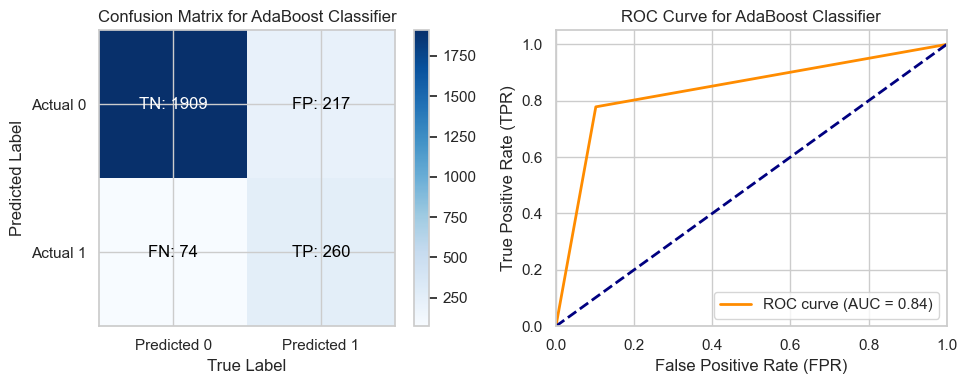

In [36]:
# Initialize the AdaBoost classifier with a random state for reproducibility
adaboost_classifier = AdaBoostClassifier(random_state=42)

# Fit the classifier to the training data
adaboost_classifier.fit(X_train_scaled, y_train_balanced)

# Predict on the test set
y_pred_adaboost = adaboost_classifier.predict(X_test_scaled)

# Define the name for the AdaBoost classifier
classifier_name_adaboost = "AdaBoost Classifier"

# Evaluate the performance of the AdaBoost classifier
evaluate_classifier(adaboost_classifier, X_test_scaled, y_test, classifier_name_adaboost)


# Implement Extra Trees Classifier

Accuracy (Extra Trees Classifier): 0.90
Precision (Extra Trees Classifier): 0.60
Recall (Extra Trees Classifier): 0.69
F1 Score (Extra Trees Classifier): 0.64
Classification Report for Extra Trees Classifier:
              precision    recall  f1-score   support

           0       0.95      0.93      0.94      2126
           1       0.60      0.69      0.64       334

    accuracy                           0.90      2460
   macro avg       0.78      0.81      0.79      2460
weighted avg       0.90      0.90      0.90      2460




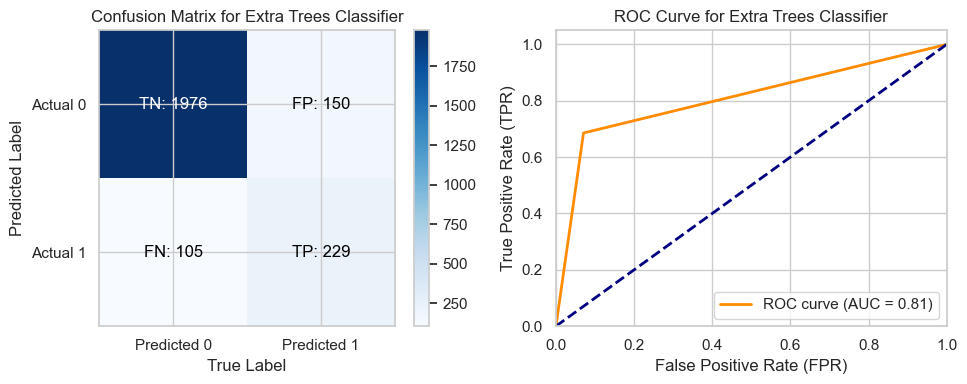

In [37]:
# Initialize the Extra Trees classifier with a random state for reproducibility
extra_trees_classifier = ExtraTreesClassifier(random_state=42)

# Fit the classifier to the training data
extra_trees_classifier.fit(X_train_scaled, y_train_balanced)

# Predict on the test set
y_pred_extra_trees = extra_trees_classifier.predict(X_test_scaled)

# Define the name for the Extra Trees classifier
classifier_name_extra_trees = "Extra Trees Classifier"

# Evaluate the performance of the Extra Trees classifier
evaluate_classifier(extra_trees_classifier, X_test_scaled, y_test, classifier_name_extra_trees)


# Implement a Support Vector Machine (SVM) Classifier Using a Linear Kernel

Accuracy (SVM-Linear Classifier): 0.88
Precision (SVM-Linear Classifier): 0.54
Recall (SVM-Linear Classifier): 0.78
F1 Score (SVM-Linear Classifier): 0.64
Classification Report for SVM-Linear Classifier:
              precision    recall  f1-score   support

           0       0.96      0.89      0.93      2126
           1       0.54      0.78      0.64       334

    accuracy                           0.88      2460
   macro avg       0.75      0.84      0.78      2460
weighted avg       0.91      0.88      0.89      2460




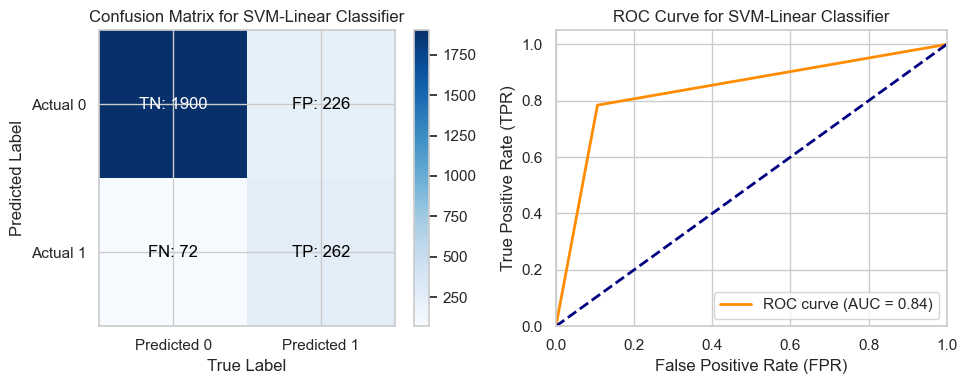

In [38]:
# Initialize the SVM classifier with a linear kernel and a random state for reproducibility
svm_linear_classifier = SVC(kernel='linear', random_state=42)

# Fit the SVM classifier to the training data
svm_linear_classifier.fit(X_train_scaled, y_train_balanced)

# Generate predictions with the linear kernel SVM classifier
y_pred_svm_linear = svm_linear_classifier.predict(X_test_scaled)

# Define the name for the SVM linear classifier
classifier_name_svm_linear = "SVM-Linear Classifier"

# Evaluate the performance of the SVM linear classifier
evaluate_classifier(svm_linear_classifier, X_test_scaled, y_test, classifier_name_svm_linear)


# Implement a Support Vector Machine (SVM) Classifier Using a RBF Kernel

Accuracy (SVM-RBF Classifier): 0.87
Precision (SVM-RBF Classifier): 0.53
Recall (SVM-RBF Classifier): 0.64
F1 Score (SVM-RBF Classifier): 0.58
Classification Report for SVM-RBF Classifier:
              precision    recall  f1-score   support

           0       0.94      0.91      0.93      2126
           1       0.53      0.64      0.58       334

    accuracy                           0.87      2460
   macro avg       0.74      0.78      0.75      2460
weighted avg       0.89      0.87      0.88      2460




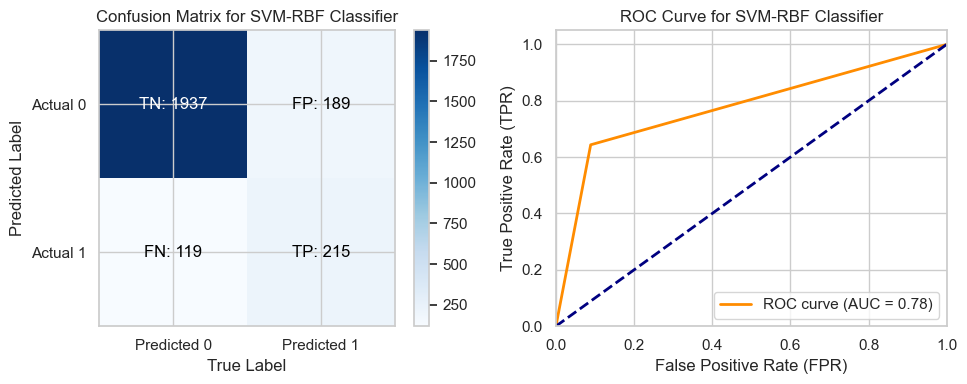

In [39]:
# Initialize the SVM classifier with an RBF kernel and a random state for reproducibility
svm_rbf_classifier = SVC(kernel='rbf', random_state=42)

# Fit the SVM classifier to the training data
svm_rbf_classifier.fit(X_train_scaled, y_train_balanced)

# Generate predictions with the RBF kernel SVM classifier
y_pred_svm_rbf = svm_rbf_classifier.predict(X_test_scaled)

# Define the name for the SVM RBF classifier
classifier_name_svm_rbf = "SVM-RBF Classifier"

# Evaluate the performance of the SVM RBF classifier
evaluate_classifier(svm_rbf_classifier, X_test_scaled, y_test, classifier_name_svm_rbf)


# Implement a Support Vector Machine (SVM) Classifier Using a Polynomial Kernel

Accuracy (SVM-Poly Classifier): 0.78
Precision (SVM-Poly Classifier): 0.36
Recall (SVM-Poly Classifier): 0.75
F1 Score (SVM-Poly Classifier): 0.48
Classification Report for SVM-Poly Classifier:
              precision    recall  f1-score   support

           0       0.95      0.79      0.86      2126
           1       0.36      0.75      0.48       334

    accuracy                           0.78      2460
   macro avg       0.65      0.77      0.67      2460
weighted avg       0.87      0.78      0.81      2460




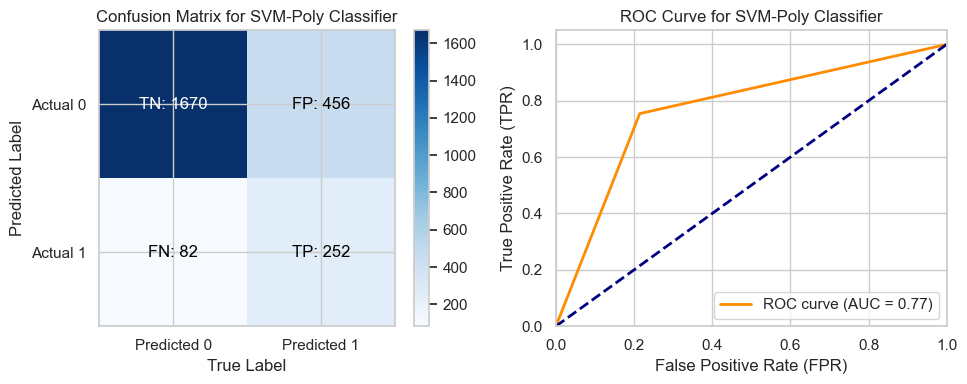

In [40]:
# Initialize the SVM classifier with a polynomial kernel and a random state for reproducibility
svm_poly_classifier = SVC(kernel='poly', degree=3, random_state=42)

# Fit the SVM classifier to the training data
svm_poly_classifier.fit(X_train_scaled, y_train_balanced)

# Generate predictions with the polynomial kernel SVM classifier
y_pred_svm_poly = svm_poly_classifier.predict(X_test_scaled)

# Define the name for the SVM polynomial classifier
classifier_name_svm_poly = "SVM-Poly Classifier"

# Evaluate the performance of the SVM polynomial classifier
evaluate_classifier(svm_poly_classifier, X_test_scaled, y_test, classifier_name_svm_poly)


# Implement Extreme Gradient Boosting classifier

Accuracy (Extreme Gradient Boosting Classifier): 0.90
Precision (Extreme Gradient Boosting Classifier): 0.64
Recall (Extreme Gradient Boosting Classifier): 0.66
F1 Score (Extreme Gradient Boosting Classifier): 0.65
Classification Report for Extreme Gradient Boosting Classifier:
              precision    recall  f1-score   support

           0       0.95      0.94      0.94      2126
           1       0.64      0.66      0.65       334

    accuracy                           0.90      2460
   macro avg       0.79      0.80      0.80      2460
weighted avg       0.91      0.90      0.90      2460




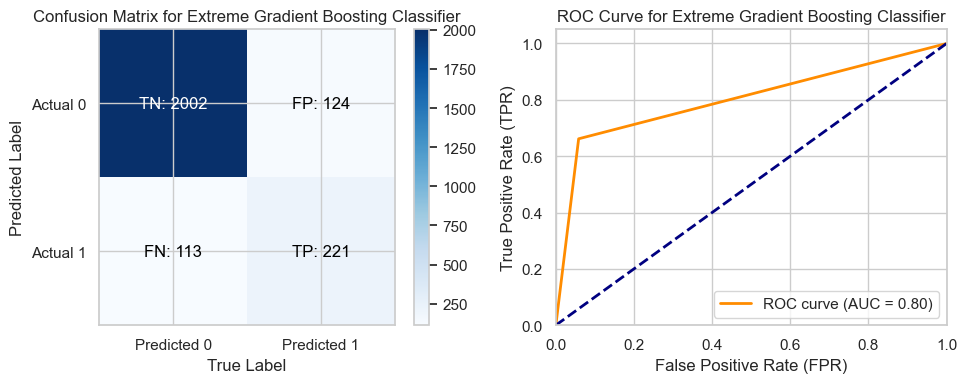

In [41]:
# Initialize the Extreme Gradient Boosting classifier
xgb_classifier = XGBClassifier(random_state=42)

# Fit the classifier to the scaled training data
xgb_classifier.fit(X_train_scaled, y_train_balanced)

# Predict labels for the test set
y_pred_xgb = xgb_classifier.predict(X_test_scaled)

# Define the name for the Extreme Gradient Boosting classifier
classifier_name_xgb = "Extreme Gradient Boosting Classifier"

# Evaluate the performance of the Extreme Gradient Boosting classifier
evaluate_classifier(xgb_classifier, X_test_scaled, y_test, classifier_name_xgb)


# Implement LightGBM classifier

[LightGBM] [Info] Number of positive: 8296, number of negative: 8296
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001624 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4335
[LightGBM] [Info] Number of data points in the train set: 16592, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
Accuracy (LightGBM Classifier): 0.91
Precision (LightGBM Classifier): 0.64
Recall (LightGBM Classifier): 0.69
F1 Score (LightGBM Classifier): 0.67
Classification Report for LightGBM Classifier:
              precision    recall  f1-score   support

           0       0.95      0.94      0.95      2126
           1       0.64      0.69      0.67       334

    accuracy                           0.91      2460
   macro avg       0.80      0.81      0.81      2460
weighted avg       0.91      0.91      0.91      2460




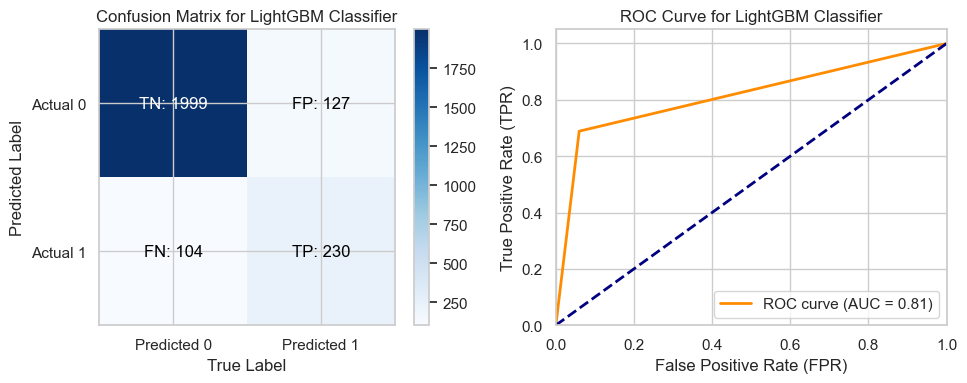

In [42]:
# Initialize the LightGBM classifier
lgbm_classifier = LGBMClassifier(random_state=42)

# Fit the classifier to the scaled training data
lgbm_classifier.fit(X_train_scaled, y_train_balanced)

# Predict labels for the test set
y_pred_lgbm = lgbm_classifier.predict(X_test_scaled)

# Define the name for the LightGBM classifier
classifier_name_lgbm = "LightGBM Classifier"

# Evaluate the performance of the LightGBM classifier
evaluate_classifier(lgbm_classifier, X_test_scaled, y_test, classifier_name_lgbm)


# Implement CatBoost classifier

Accuracy (CatBoost Classifier): 0.91
Precision (CatBoost Classifier): 0.68
Recall (CatBoost Classifier): 0.67
F1 Score (CatBoost Classifier): 0.68
Classification Report for CatBoost Classifier:
              precision    recall  f1-score   support

           0       0.95      0.95      0.95      2126
           1       0.68      0.67      0.68       334

    accuracy                           0.91      2460
   macro avg       0.81      0.81      0.81      2460
weighted avg       0.91      0.91      0.91      2460




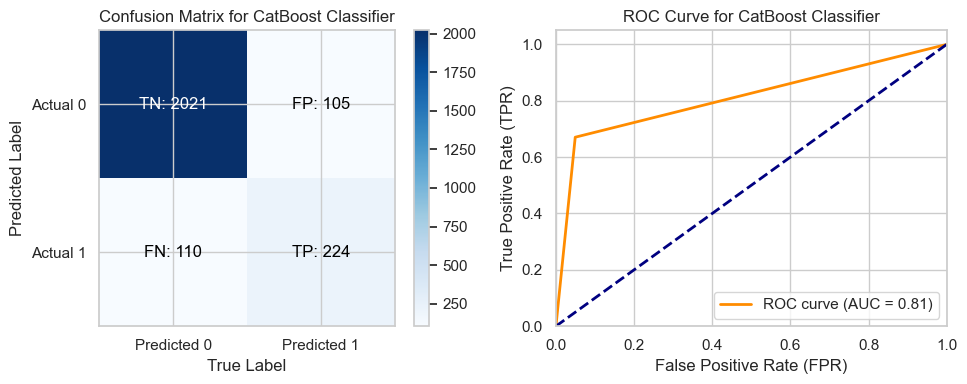

In [43]:
# Initialize the CatBoost classifier
catboost_classifier = CatBoostClassifier(random_state=42, verbose=False)

# Fit the classifier to the scaled training data
catboost_classifier.fit(X_train_scaled, y_train_balanced)

# Predict labels for the test set
y_pred_catboost = catboost_classifier.predict(X_test_scaled)

# Define the name for the CatBoost classifier
classifier_name_catboost = "CatBoost Classifier"

# Evaluate the performance of the CatBoost classifier
evaluate_classifier(catboost_classifier, X_test_scaled, y_test, classifier_name_catboost)


# Implement Neural Network Classifier

Epoch 1/10
415/415 [==============================] - 2s 3ms/step - loss: 0.3937 - accuracy: 0.8191 - val_loss: 0.5046 - val_accuracy: 0.7340
Epoch 2/10
415/415 [==============================] - 1s 2ms/step - loss: 0.3163 - accuracy: 0.8626 - val_loss: 0.3653 - val_accuracy: 0.8475
Epoch 3/10
415/415 [==============================] - 1s 2ms/step - loss: 0.2886 - accuracy: 0.8775 - val_loss: 0.3160 - val_accuracy: 0.8807
Epoch 4/10
415/415 [==============================] - 1s 2ms/step - loss: 0.2729 - accuracy: 0.8837 - val_loss: 0.2808 - val_accuracy: 0.8961
Epoch 5/10
415/415 [==============================] - 1s 2ms/step - loss: 0.2613 - accuracy: 0.8910 - val_loss: 0.2619 - val_accuracy: 0.9108
Epoch 6/10
415/415 [==============================] - 1s 2ms/step - loss: 0.2506 - accuracy: 0.8949 - val_loss: 0.2472 - val_accuracy: 0.9111
Epoch 7/10
415/415 [==============================] - 1s 2ms/step - loss: 0.2425 - accuracy: 0.8990 - val_loss: 0.2502 - val_accuracy: 0.9111
Epoch 

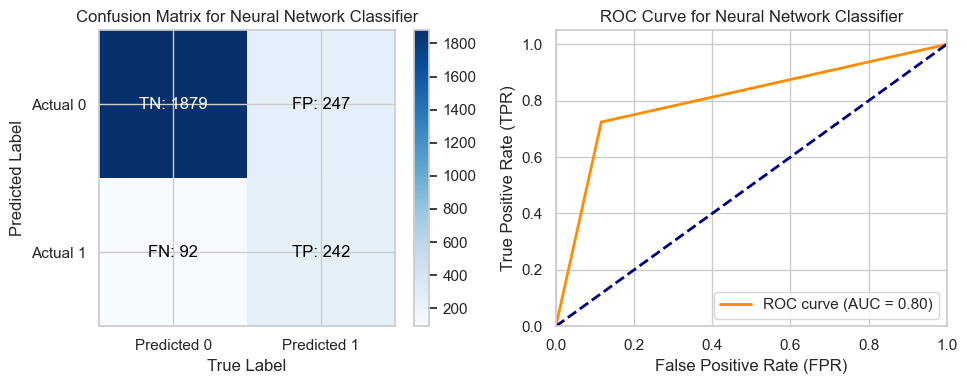

In [44]:
# Initialize a Sequential model
model = tf.keras.Sequential()

# Add input layer (specify input shape based on the number of features)
model.add(layers.Input(shape=(X_train_scaled.shape[1],)))

# Add one or more hidden layers (customize the number of neurons and activation function)
model.add(layers.Dense(128, activation='relu'))
model.add(layers.Dense(64, activation='relu'))

# Add the output layer (usually 1 neuron for binary classification, sigmoid activation)
model.add(layers.Dense(1, activation='sigmoid'))

# Compile the model (specify loss function, optimizer, and metrics)
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

# Fit the model to the training data
history = model.fit(X_train_scaled, y_train_balanced, epochs=10, batch_size=32, validation_split=0.2)

# Predict on the test set
y_pred_nn = (model.predict(X_test_scaled) > 0.5).astype("int32")

# Define the name for the neural network classifier
classifier_name_nn = "Neural Network Classifier"

# Evaluate the trained neural network model
evaluate_classifier(model, X_test_scaled, y_test, classifier_name_nn, threshold=0.5)


## Implement MLP Classifier

Accuracy (Multilayer Perceptron Classifier): 0.85
Precision (Multilayer Perceptron Classifier): 0.46
Recall (Multilayer Perceptron Classifier): 0.58
F1 Score (Multilayer Perceptron Classifier): 0.51
Classification Report for Multilayer Perceptron Classifier:
              precision    recall  f1-score   support

           0       0.93      0.89      0.91      2126
           1       0.46      0.58      0.51       334

    accuracy                           0.85      2460
   macro avg       0.70      0.74      0.71      2460
weighted avg       0.87      0.85      0.86      2460




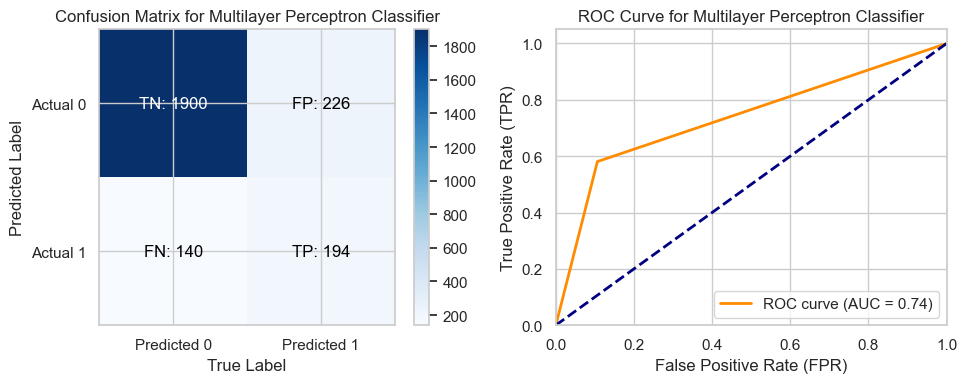

In [45]:
# Initialize the Multilayer Perceptron Classifier
mlp_classifier = MLPClassifier(hidden_layer_sizes=(100,), max_iter=1000, activation='relu', random_state=42)

# Fit the classifier to the training data
mlp_classifier.fit(X_train_scaled, y_train_balanced)

# Predict on the test set
y_pred_mlp = mlp_classifier.predict(X_test_scaled)

# Define the name for the MLP Classifier
classifier_name_mlp = "Multilayer Perceptron Classifier"

# Evaluate MLP Classifier Performance
evaluate_classifier(mlp_classifier, X_test_scaled, y_test, classifier_name_mlp)


## Implement Stacked Ensemble MLP

Script start time: 2024-03-05 17:03:01
77/77 [==============================] - 0s 1ms/step
Accuracy (Stacked MLP Model): 0.91
Precision (Stacked MLP Model): 0.70
Recall (Stacked MLP Model): 0.58
F1 Score (Stacked MLP Model): 0.64
Classification Report for Stacked MLP Model:
              precision    recall  f1-score   support

           0       0.94      0.96      0.95      2126
           1       0.70      0.58      0.64       334

    accuracy                           0.91      2460
   macro avg       0.82      0.77      0.79      2460
weighted avg       0.90      0.91      0.91      2460




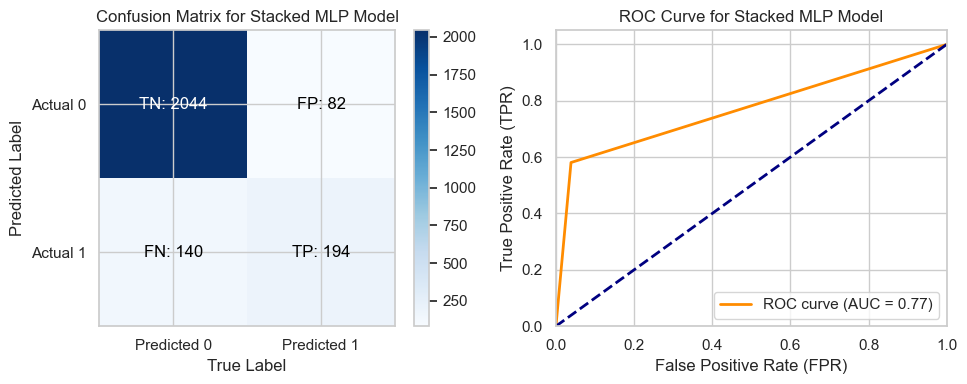

Script end time: 2024-03-05 17:33:38


In [46]:
# Define function to create the base MLP model
def create_base_mlp_model(input_shape):
    """Creates a base MLP model with the specified architecture."""
    model = Sequential([
        Dense(16, activation='relu', input_shape=(input_shape,)),
        Dense(12, activation='relu'),
        Dense(8, activation='relu'),
        Dense(4, activation='relu'),
        Dense(1, activation='sigmoid')
    ])
    # Compile the model
    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
    return model

# Define function to create the intermediate MLP model for Level 1
def create_intermediate_mlp_model(input_shape):
    """Creates an intermediate MLP model for Level 1."""
    model = Sequential([
        Dense(10, activation='relu', input_shape=(input_shape,)),
        Dense(8, activation='relu'),
        Dense(1, activation='sigmoid')
    ])
    # Compile the model
    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
    return model

# Define function to create the meta MLP model for Level 2
def create_meta_mlp_model(input_shape):
    """Creates the meta MLP model for Level 2."""
    model = Sequential([
        Dense(10, activation='relu', input_shape=(input_shape,)),
        Dense(1, activation='sigmoid')
    ])
    # Compile the model
    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
    return model

num_base_models = 5

# Create and train the base models
base_models = [create_base_mlp_model(X_train_scaled.shape[1]) for _ in range(num_base_models)]
for model in base_models:
    model.fit(X_train_scaled, y_train_balanced, epochs=300, batch_size=32, verbose=0)

# Generate predictions for Level 1 Model training
level_0_predictions = np.hstack([model.predict(X_test_scaled) for model in base_models])

# Train the intermediate Level 1 model
intermediate_model = create_intermediate_mlp_model(level_0_predictions.shape[1])
intermediate_model.fit(level_0_predictions, y_test, epochs=150, batch_size=32, verbose=0)

# Generate predictions for Level 2 Model training
level_1_predictions = intermediate_model.predict(level_0_predictions)

# Prepare Level 1 predictions for Level 2 training
level_1_test_predictions = np.hstack([model.predict(X_test_scaled) for model in base_models])
level_1_test_predictions = intermediate_model.predict(level_1_test_predictions)

# Train the final Level 2 meta-model
meta_model = create_meta_mlp_model(level_1_predictions.shape[1])
meta_model.fit(level_1_predictions, y_test, epochs=150, batch_size=32, verbose=0)

# Final predictions using the Level 2 meta-model
final_predictions = meta_model.predict(level_1_test_predictions)
final_predictions_binary = (final_predictions > 0.5).astype(int)

# Evaluate the stacked MLP model using the evaluate_classifier function
evaluate_classifier(meta_model, level_1_test_predictions, y_test, "Stacked MLP Model")

# Print script end time
from datetime import datetime
end_time = datetime.now()
print("Script end time:", end_time.strftime('%Y-%m-%d %H:%M:%S'))


In [47]:
# Create a DataFrame from your results dictionary
results_df = pd.DataFrame(results).T

# Sort the DataFrame by index (name)
sorted_results_df = results_df.sort_index()

# Display the sorted DataFrame
print(sorted_results_df)


                                      Accuracy  Precision    Recall  F1 Score  \
AdaBoost Classifier                   0.881707   0.545073  0.778443  0.641184   
CatBoost Classifier                   0.912602   0.680851  0.670659  0.675716   
Decision Tree Classifier              0.845122   0.448802  0.616766  0.519546   
Extra Trees Classifier                0.896341   0.604222  0.685629  0.642356   
Extreme Gradient Boosting Classifier  0.903659   0.640580  0.661677  0.650957   
Gradient Boosting Classifier          0.900000   0.616402  0.697605  0.654494   
KNN Classifier                        0.755285   0.312849  0.670659  0.426667   
LightGBM Classifier                   0.906098   0.644258  0.688623  0.665702   
Logistic Regression                   0.642276   0.255814  0.856287  0.393939   
Multilayer Perceptron Classifier      0.851220   0.461905  0.580838  0.514589   
Neural Network Classifier             0.862195   0.494888  0.724551  0.588092   
Random Forest Classifier    

In [48]:
print(results_df)

                                      Accuracy  Precision    Recall  F1 Score  \
Logistic Regression                   0.642276   0.255814  0.856287  0.393939   
KNN Classifier                        0.755285   0.312849  0.670659  0.426667   
Decision Tree Classifier              0.845122   0.448802  0.616766  0.519546   
Random Forest Classifier              0.905691   0.635638  0.715569  0.673239   
Gradient Boosting Classifier          0.900000   0.616402  0.697605  0.654494   
AdaBoost Classifier                   0.881707   0.545073  0.778443  0.641184   
Extra Trees Classifier                0.896341   0.604222  0.685629  0.642356   
SVM-Linear Classifier                 0.878862   0.536885  0.784431  0.637470   
SVM-RBF Classifier                    0.874797   0.532178  0.643713  0.582656   
SVM-Poly Classifier                   0.781301   0.355932  0.754491  0.483685   
Extreme Gradient Boosting Classifier  0.903659   0.640580  0.661677  0.650957   
LightGBM Classifier         

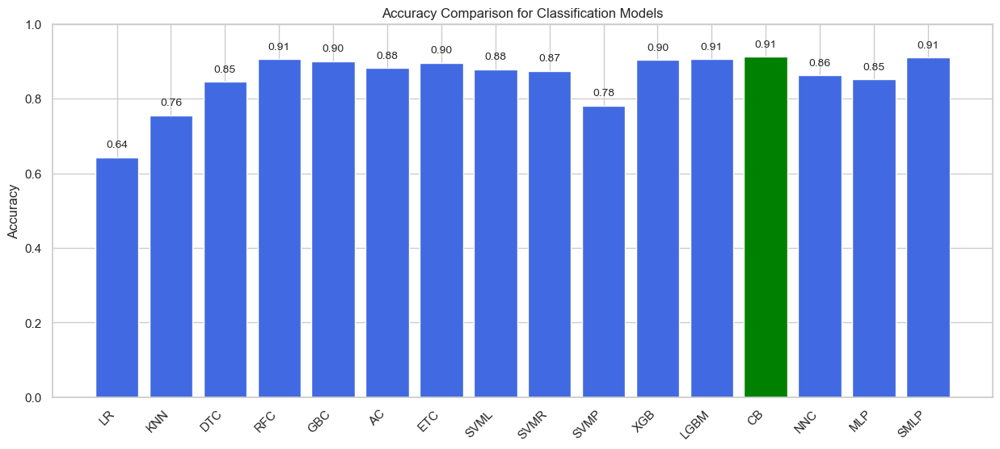

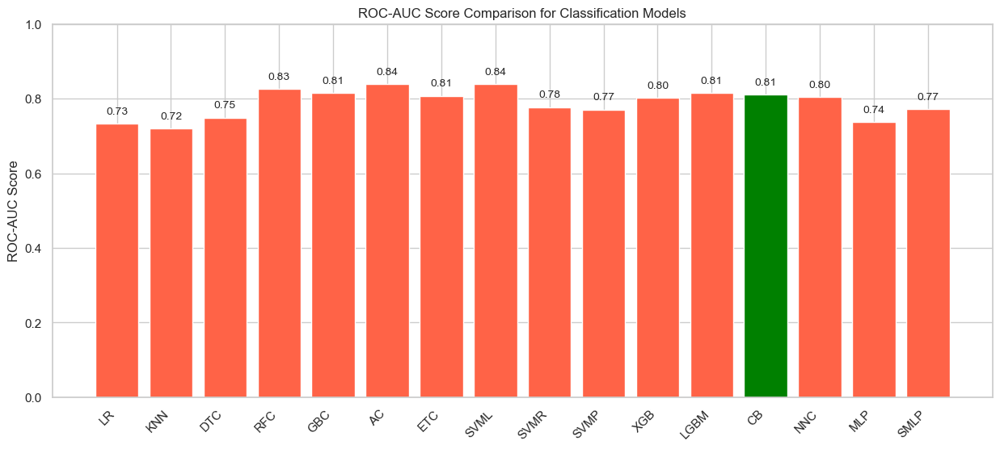





Abbreviations and their corresponding classifiers:
LR: Logistic Regression
KNN: KNN Classifier
DTC: Decision Tree Classifier
RFC: Random Forest Classifier
GBC: Gradient Boosting Classifier
AC: AdaBoost Classifier
ETC: Extra Trees Classifier
SVML: SVM-Linear Classifier
SVMR: SVM-RBF Classifier
SVMP: SVM-Poly Classifier
XGB: Extreme Gradient Boosting Classifier
LGBM: LightGBM Classifier
CB: CatBoost Classifier
NNC: Neural Network Classifier
MLP: Multilayer Perceptron Classifier
SMLP: Stacked MLP Model


In [49]:
# Assuming you have a DataFrame named results_df
results_df = pd.DataFrame(results).T

# Define the classifier names and their corresponding abbreviations
classifier_names = results_df.index.tolist()
# Updated list to include all specified abbreviations
abbreviated_names = [
    "LR", "KNN", "DTC", "RFC", "GBC", "AC", "ETC", "SVML", "SVMR", "SVMP",
    "XGB", "LGBM", "CB", "NNC", "MLP", "SMLP"  
]

# Make sure the abbreviation list matches the number of classifiers
assert len(classifier_names) == len(abbreviated_names), "Mismatch in classifier and abbreviation lists"

# Extract accuracy and ROC-AUC scores
accuracy_scores = results_df['Accuracy'].tolist()
roc_auc_scores = results_df['ROC-AUC'].tolist()

# Determine the best model by accuracy
best_model_index = accuracy_scores.index(max(accuracy_scores))

# Accuracy comparison chart
fig, ax1 = plt.subplots(figsize=(15, 6))
ax1.bar(abbreviated_names, accuracy_scores, color=['royalblue' if i != best_model_index else 'green' for i in range(len(abbreviated_names))])
ax1.set_ylabel('Accuracy')
ax1.set_title('Accuracy Comparison for Classification Models')
ax1.set_ylim(0, 1)  # Set the y-axis limits
plt.setp(ax1.get_xticklabels(), rotation=45, horizontalalignment='right')
for i, v in enumerate(accuracy_scores):
    ax1.text(i, v + 0.02, f'{v:.2f}', ha='center', va='bottom', fontsize=10)
plt.show()

# ROC-AUC score comparison chart
fig, ax2 = plt.subplots(figsize=(15, 6))
ax2.bar(abbreviated_names, roc_auc_scores, color=['tomato' if i != best_model_index else 'green' for i in range(len(abbreviated_names))])
ax2.set_ylabel('ROC-AUC Score')
ax2.set_title('ROC-AUC Score Comparison for Classification Models')
ax2.set_ylim(0, 1)  # Set the y-axis limits
plt.setp(ax2.get_xticklabels(), rotation=45, horizontalalignment='right')
for i, v in enumerate(roc_auc_scores):
    ax2.text(i, v + 0.02, f'{v:.2f}', ha='center', va='bottom', fontsize=10)
plt.show()

# Abbreviations and their corresponding names are printed out after the plots
print("\n" * 3)
print("Abbreviations and their corresponding classifiers:")
for i, name in enumerate(classifier_names):
    print(f"{abbreviated_names[i]}: {name}")
